# Compare SAR-derived runoff onset to snow pillow-derived runoff onset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xarray as xr
import geopandas as gpd
import xyzservices.providers as xyz
import easysnowdata
from global_snowmelt_runoff_onset.config import Config
import global_snowmelt_runoff_onset.processing as processing
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx


In [2]:
config = Config('../config/global_config_v6.txt')

Configuration loaded:
resolution = 0.00072000072000072
bands = vv
spatial_chunk_dim = 2048
bbox_left = -179.999
bbox_right = 179.999
bbox_top = 81.099
bbox_bottom = -59.999
wy_start = 2015
wy_end = 2024
low_backscatter_threshold = 0.001
min_monthly_acquisitions = 1
max_allowed_days_gap_per_orbit = 30
min_years_for_median_std = 3
valid_tiles_geojson_path = ../processing/global_tiles_with_seasonal_snow.geojson
tile_results_path = ../processing/tile_results_v6.csv
global_runoff_zarr_store_azure_path = snowmelt/snowmelt_runoff_onset/global_v6.zarr
seasonal_snow_mask_zarr_store_azure_path = snowmelt/snow_cover/global_modis_snow_cover.zarr


In [3]:
StationsWUS = easysnowdata.automatic_weather_stations.StationCollection()
StationsWUS.get_entire_data_archive()

Geodataframe with all stations has been added to the Station object. Please use the .all_stations attribute to access.
Use the .get_data(stations=geodataframe/string/list,variables=string/list,start_date=str,end_date=str) method to fetch data for specific stations and variables.
Decompressing data...
Creating xarray.Dataset from the uncompressed data...
Done! Entire archive dataset has been added to the station object. Please use the .entire_data_archive attribute to access.


In [4]:
tiles_with_stations_gdf = gpd.sjoin(
    config.valid_tiles_gdf,
    StationsWUS.all_stations,
    how='inner',
    predicate='contains'
)
tiles_with_stations_gdf = tiles_with_stations_gdf.drop_duplicates(subset=['row','col'])
tiles_with_stations_gdf

,row,col,percent_valid_snow_pixels,geometry,s1_rtc_ds_dims,runoff_onsets_dims,tr_2015,tr_2016,tr_2017,tr_2018,...,elevation_m,latitude,longitude,state,HUC,mgrs,mountainRange,beginDate,endDate,csvData
1424,13,25,100.000000,"POLYGON ((-143.13542 61.93014, -143.13542 60.4...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,13.808,6.527,...,490.727997,61.347832,-142.709671,Alaska,190201031603,07VDJ,None,2006-10-01,2025-06-22,True
1416,13,17,100.000000,"POLYGON ((-154.93191 61.93014, -154.93191 60.4...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,9.324,12.187,...,388.619995,60.982430,-153.917725,Alaska,190304052303,05VMH,Alaska Range,2014-07-09,2025-06-22,True
1243,12,25,100.000000,"POLYGON ((-143.13542 63.4047, -143.13542 61.93...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,NaN,6.727,...,1011.935974,62.069000,-142.048996,Alaska,190803010305,07VDJ,None,2007-10-01,2025-06-22,True
1241,12,23,100.000000,"POLYGON ((-146.08455 63.4047, -146.08455 61.93...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,14.256,5.671,...,914.400024,63.202671,-145.630493,Alaska,190803040302,06VWR,None,2014-08-07,2025-06-22,True
1238,12,20,100.000000,"POLYGON ((-150.50823 63.4047, -150.50823 61.93...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,NaN,11.175,...,114.300003,62.133331,-150.041672,Alaska,190205050105,05VPJ,None,1986-10-01,2025-06-22,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3759,31,46,0.566811,"POLYGON ((-112.16963 35.38804, -112.16963 33.9...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,13.594,NaN,...,2328.672119,34.312019,-110.754311,Arizona,150200100201,12SWC,None,1953-10-01,2025-06-22,True
3685,30,43,0.487591,"POLYGON ((-116.59332 36.8626, -116.59332 35.38...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",23.567,NaN,21.321,6.000,...,2395.728027,36.249298,-115.629723,Nevada,150100150301,11SPA,Great Basin Ranges,2008-10-01,2025-06-22,True
3819,32,50,0.352741,"POLYGON ((-106.27139 33.91347, -106.27139 32.4...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",NaN,NaN,7.014,6.055,...,3133.343994,33.404720,-105.787216,New Mexico,130600080103,13SDS,Southwest Basins and Ranges,2002-09-30,2025-06-22,True
3080,24,38,0.152408,"POLYGON ((-123.96612 45.70997, -123.96612 44.2...","{'latitude': 2048, 'longitude': 2048, 'time': ...","{'water_year': 10, 'latitude': 2048, 'longitud...",25.071,12.155,5.430,10.613,...,128.016006,45.247551,-123.275627,Oregon,170900080606,10TDR,Oregon Coast Range,2006-09-22,2025-06-22,True


In [5]:
def calculate_temporal_resolutions(gdf):
    # Initialize results dictionary
    yearly_means = {}
    
    # Calculate yearly weighted means
    for year in range(2015, 2025):
        tr_col = f'tr_{year}'
        pix_col = f'pix_ct_{year}'
        
        if tr_col in gdf.columns and pix_col in gdf.columns:
            # Filter out NaN values for this year
            year_data = gdf[[tr_col, pix_col]].dropna()
            if not year_data.empty:
                weighted_mean = np.average(
                    year_data[tr_col],
                    weights=year_data[pix_col]
                )
                yearly_means[year] = weighted_mean
    
    # Calculate overall weighted mean
    tr_cols = [f'tr_{year}' for year in range(2015, 2025)]
    pix_cols = [f'pix_ct_{year}' for year in range(2015, 2025)]
    
    # Create DataFrame with all tr and pixel count values
    all_data = pd.DataFrame({
        'tr': gdf[tr_cols].values.flatten(),
        'pix': gdf[pix_cols].values.flatten()
    })
    
    # Remove rows where either tr or pix is NaN
    all_data = all_data.dropna()
    
    overall_mean = np.average(all_data['tr'], weights=all_data['pix']) if not all_data.empty else np.nan
    
    return yearly_means, overall_mean

# Calculate results
yearly_means, overall_mean = calculate_temporal_resolutions(tiles_with_stations_gdf)

# Print results
for year, mean in yearly_means.items():
    print(f"Weighted average temporal resolution for {year}: {mean:.2f}")
print(f"\nOverall weighted average temporal resolution: {overall_mean:.2f}")

Weighted average temporal resolution for 2015: 22.55
Weighted average temporal resolution for 2016: 22.07
Weighted average temporal resolution for 2017: 9.57
Weighted average temporal resolution for 2018: 8.94
Weighted average temporal resolution for 2019: 8.39
Weighted average temporal resolution for 2020: 6.00
Weighted average temporal resolution for 2021: 5.59
Weighted average temporal resolution for 2022: 9.67
Weighted average temporal resolution for 2023: 8.79
Weighted average temporal resolution for 2024: 11.49

Overall weighted average temporal resolution: 9.09


## Evaluating sensitivities

In [6]:
#test_ds = xr.open_dataset('station_comparison/snotel_sar_differences_treemask_v5.nc').compute()
#test_ds = xr.open_dataset('station_comparison/snotel_sar_differences_treemask_UPDATED_SNOTEL_LOCATIONS_v5.nc').compute()
#test_ds = xr.open_dataset('station_comparison/snotel_sar_differences_treemask_UPDATED_SNOTEL_LOCATIONS_andreq20cmSWEfor60days_v5.nc').compute()
#test_ds = xr.open_dataset('station_comparison/snotel_sar_differences_UPDATED_SNOTEL_LOCATIONS_andreq20cmSWEfor60days_v5.nc').compute()
#test_ds = xr.open_dataset('station_comparison/snotel_sar_differences_UPDATED_SNOTEL_LOCATIONS_v5.nc').compute()
runoff_onset_max_swe_timing_WUS_ds = xr.open_dataset('comparison_datasets/snotel_sar_differences_UPDATED_SNOTEL_LOCATIONS_andreq5cmSWEfor60days_v6.nc').compute()
runoff_onset_max_swe_timing_WUS_ds

<xarray.Dataset> Size: 25MB
Dimensions:                       (WY: 10, station: 969, buffer_radius: 5,
                                   fcf: 10)
Coordinates: (12/17)
    time                          (WY, station) datetime64[ns] 78kB 2015-03-1...
  * station                       (station) <U12 47kB '1135_UT_SNTL' ... '915...
    name                          (station) <U24 93kB 'Burts Miller Ranch' .....
    network                       (station) <U6 23kB 'SNOTEL' ... 'SNOTEL'
    elevation_m                   (station) float64 8kB 2.438e+03 ... 2.63e+03
    latitude                      (station) float64 8kB 40.98 44.79 ... 44.85
    ...                            ...
    beginDate                     (station) datetime64[ns] 8kB 2009-10-01 ......
    endDate                       (station) datetime64[ns] 8kB 2025-06-22 ......
    csvData                       (station) bool 969B True True ... True True
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
  * buffer_radius                 (buffer_radius) int64 40B 100 200 300 500 1000
  * fcf                           (fcf) int64 80B 10 20 30 40 50 60 70 80 90 100
Data variables: (12/14)
    station_max_SWE_timing        (station, WY) float64 78kB 165.0 ... 193.0
    station_max_SWE_value         (station, WY) float64 78kB 0.1168 ... 0.2769
    station_max_SWE_99pct_timing  (station, WY) float64 78kB 165.0 ... 194.0
    station_max_SWE_95pct_timing  (station, WY) float64 78kB 165.0 ... 196.0
    station_max_SWE_90pct_timing  (station, WY) float64 78kB 166.0 ... 197.0
    station_max_SWE_50pct_timing  (station, WY) float64 78kB 170.0 ... 226.0
    ...                            ...
    mean_fcf                      (station, buffer_radius, fcf) float64 388kB ...
    sar_minus_stations            (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_99pct               (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_95pct               (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_90pct               (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_50pct               (station, WY, buffer_radius, fcf) float64 4MB ...

Text(0.5, 1.0, 'count sar_minus_stations where frac_valid_fcf>0.8')

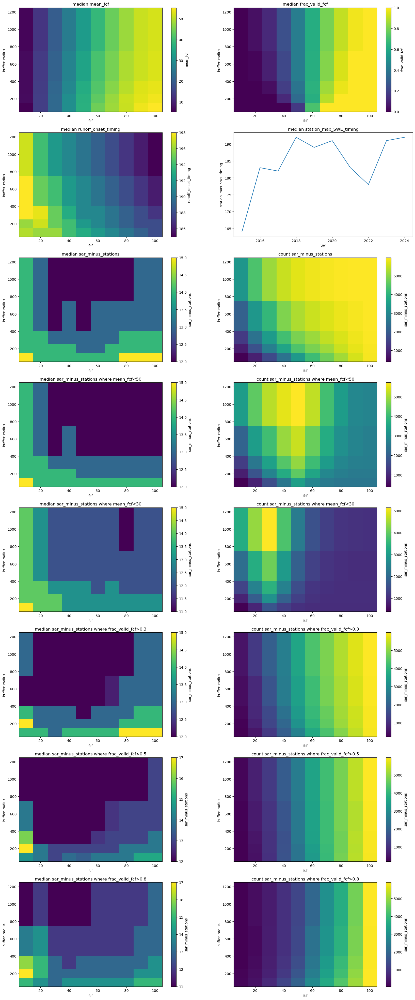

In [7]:
f,axs=plt.subplots(8,2,figsize=(20,50))

axs_flat = axs.flatten()
runoff_onset_max_swe_timing_WUS_ds['mean_fcf'].median(dim='station').plot(ax=axs_flat[0])
axs_flat[0].set_title('median mean_fcf')

runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf'].median(dim='station').plot(ax=axs_flat[1])
axs_flat[1].set_title('median frac_valid_fcf')

runoff_onset_max_swe_timing_WUS_ds['runoff_onset_timing'].median(dim=['station','WY']).plot(ax=axs_flat[2])
axs_flat[2].set_title('median runoff_onset_timing')

runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_timing'].median(dim=['station']).plot(ax=axs_flat[3])
axs_flat[3].set_title('median station_max_SWE_timing')

np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations']).median(dim=['station','WY']).plot(ax=axs_flat[4])
axs_flat[4].set_title('median sar_minus_stations')

runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].count(dim=['station','WY']).plot(ax=axs_flat[5])
axs_flat[5].set_title('count sar_minus_stations')

np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['mean_fcf']<50)).median(dim=['station','WY']).plot(ax=axs_flat[6])
axs_flat[6].set_title('median sar_minus_stations where mean_fcf<50')

runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['mean_fcf']<50).count(dim=['station','WY']).plot(ax=axs_flat[7])
axs_flat[7].set_title('count sar_minus_stations where mean_fcf<50')

np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['mean_fcf']<30)).median(dim=['station','WY']).plot(ax=axs_flat[8])
axs_flat[8].set_title('median sar_minus_stations where mean_fcf<30')

runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['mean_fcf']<30).count(dim=['station','WY']).plot(ax=axs_flat[9])
axs_flat[9].set_title('count sar_minus_stations where mean_fcf<30')


np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.3)).median(dim=['station','WY']).plot(ax=axs_flat[10])
axs_flat[10].set_title('median sar_minus_stations where frac_valid_fcf>0.3')

runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.3).count(dim=['station','WY']).plot(ax=axs_flat[11])
axs_flat[11].set_title('count sar_minus_stations where frac_valid_fcf>0.3')


np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.5)).median(dim=['station','WY']).plot(ax=axs_flat[12])
axs_flat[12].set_title('median sar_minus_stations where frac_valid_fcf>0.5')

runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.5).count(dim=['station','WY']).plot(ax=axs_flat[13])
axs_flat[13].set_title('count sar_minus_stations where frac_valid_fcf>0.5')

np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.8)).median(dim=['station','WY']).plot(ax=axs_flat[14])
axs_flat[14].set_title('median sar_minus_stations where frac_valid_fcf>0.8')

runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.8).count(dim=['station','WY']).plot(ax=axs_flat[15])
axs_flat[15].set_title('count sar_minus_stations where frac_valid_fcf>0.8')

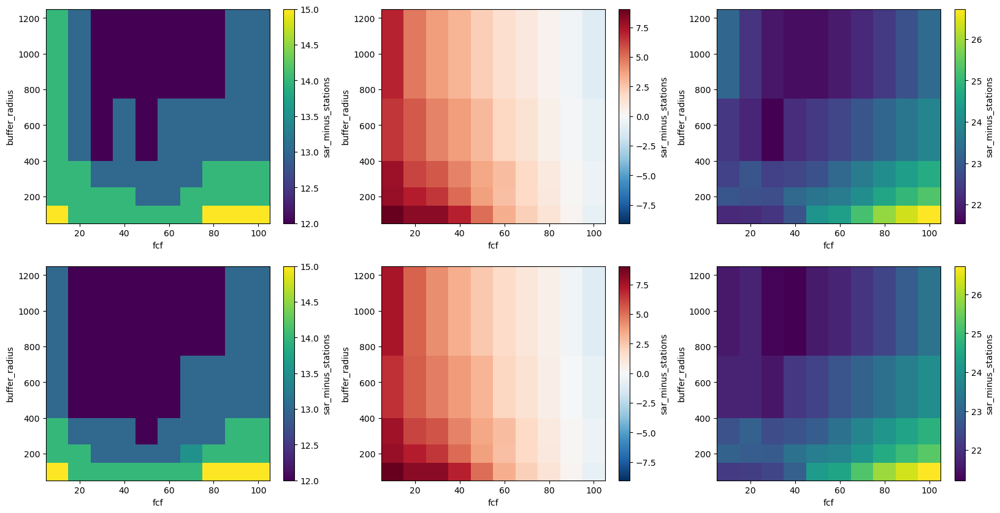

In [8]:
f,axs=plt.subplots(2,3,figsize=(20,10))

axs_flat = axs.flatten()
np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations']).median(dim=['station','WY']).plot(ax=axs_flat[0])
runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].mean(dim=['station','WY']).plot(ax=axs_flat[1])
runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].std(dim=['station','WY']).plot(ax=axs_flat[2])

np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.1)).median(dim=['station','WY']).plot(ax=axs_flat[3])
runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.01).mean(dim=['station','WY']).plot(ax=axs_flat[4])
runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.01).std(dim=['station','WY']).plot(ax=axs_flat[5])

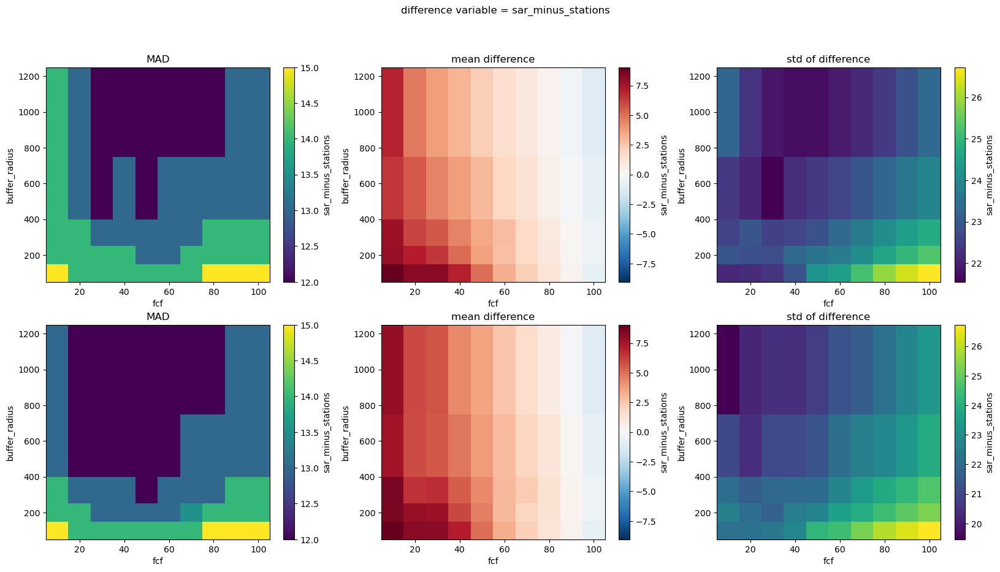

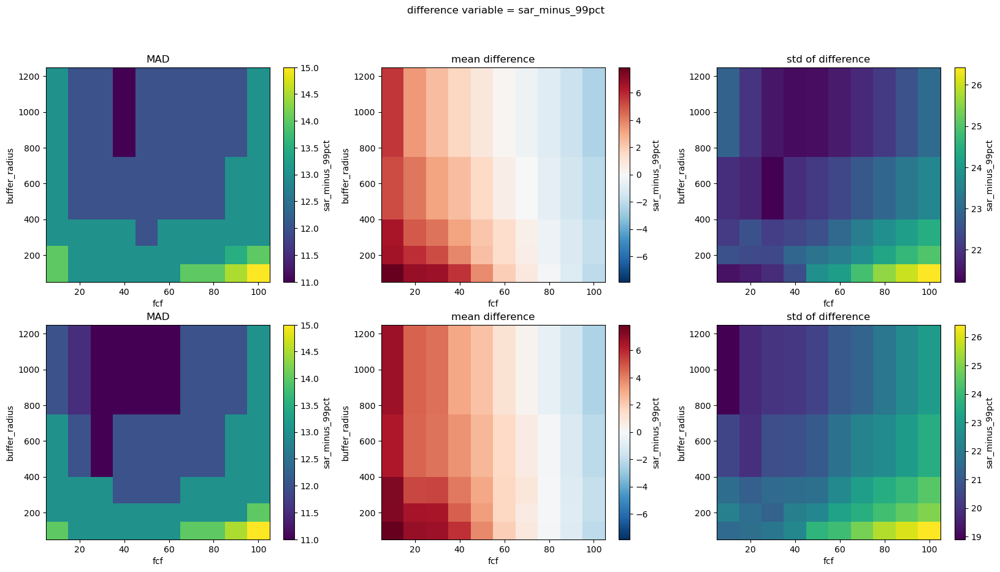

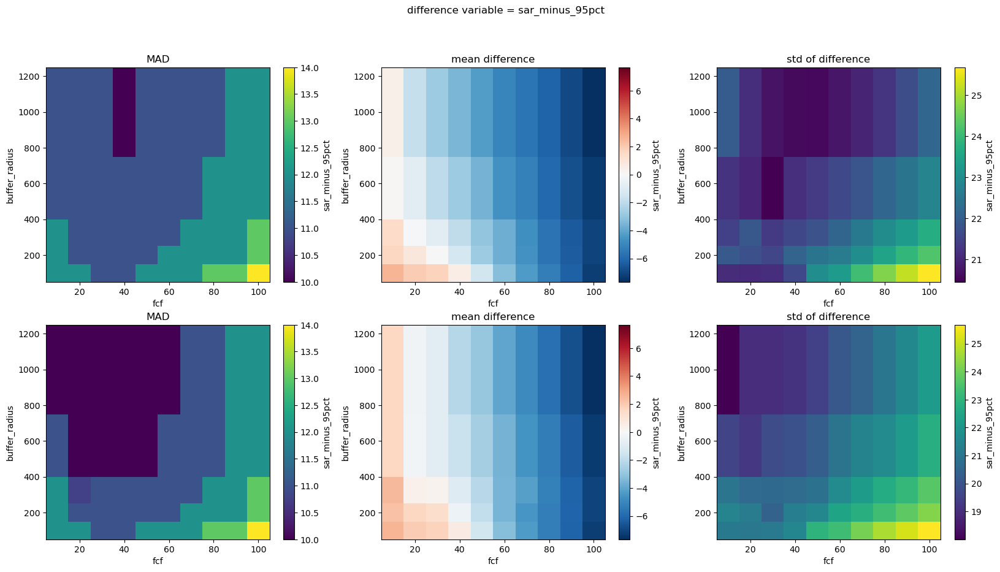

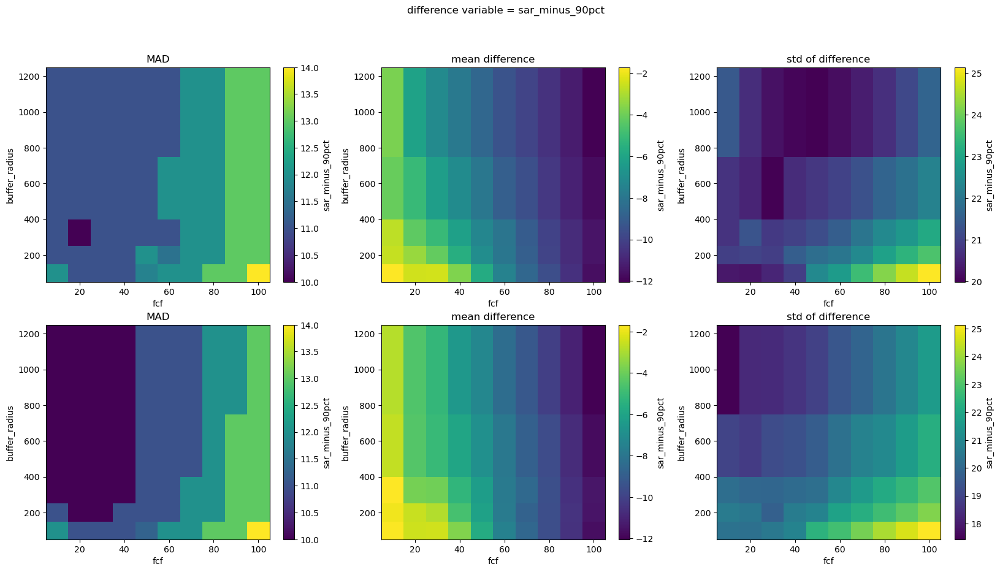

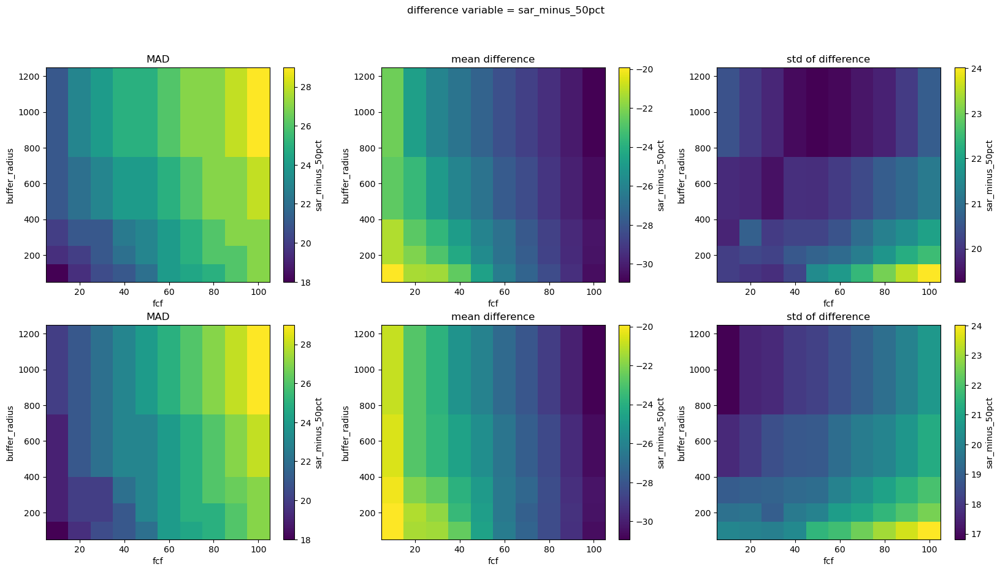

In [9]:
for difference_variable in ['sar_minus_stations','sar_minus_99pct','sar_minus_95pct','sar_minus_90pct','sar_minus_50pct']:
    f,axs=plt.subplots(2,3,figsize=(20,10))
    f.suptitle(f'difference variable = {difference_variable}')
    axs_flat = axs.flatten()
    np.abs(runoff_onset_max_swe_timing_WUS_ds[difference_variable]).median(dim=['station','WY']).plot(ax=axs_flat[0])
    axs_flat[0].set_title('MAD')
    runoff_onset_max_swe_timing_WUS_ds[difference_variable].mean(dim=['station','WY']).plot(ax=axs_flat[1])
    axs_flat[1].set_title('mean difference')
    runoff_onset_max_swe_timing_WUS_ds[difference_variable].std(dim=['station','WY']).plot(ax=axs_flat[2])
    axs_flat[2].set_title('std of difference')


    np.abs(runoff_onset_max_swe_timing_WUS_ds[difference_variable].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.1)).median(dim=['station','WY']).plot(ax=axs_flat[3])
    axs_flat[3].set_title('MAD')
    runoff_onset_max_swe_timing_WUS_ds[difference_variable].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.1).mean(dim=['station','WY']).plot(ax=axs_flat[4])
    axs_flat[4].set_title('mean difference')
    runoff_onset_max_swe_timing_WUS_ds[difference_variable].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.1).std(dim=['station','WY']).plot(ax=axs_flat[5])
    axs_flat[5].set_title('std of difference')

In [10]:
runoff_onset_max_swe_timing_WUS_ds

<xarray.Dataset> Size: 25MB
Dimensions:                       (WY: 10, station: 969, buffer_radius: 5,
                                   fcf: 10)
Coordinates: (12/17)
    time                          (WY, station) datetime64[ns] 78kB 2015-03-1...
  * station                       (station) <U12 47kB '1135_UT_SNTL' ... '915...
    name                          (station) <U24 93kB 'Burts Miller Ranch' .....
    network                       (station) <U6 23kB 'SNOTEL' ... 'SNOTEL'
    elevation_m                   (station) float64 8kB 2.438e+03 ... 2.63e+03
    latitude                      (station) float64 8kB 40.98 44.79 ... 44.85
    ...                            ...
    beginDate                     (station) datetime64[ns] 8kB 2009-10-01 ......
    endDate                       (station) datetime64[ns] 8kB 2025-06-22 ......
    csvData                       (station) bool 969B True True ... True True
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
  * buffer_radius                 (buffer_radius) int64 40B 100 200 300 500 1000
  * fcf                           (fcf) int64 80B 10 20 30 40 50 60 70 80 90 100
Data variables: (12/14)
    station_max_SWE_timing        (station, WY) float64 78kB 165.0 ... 193.0
    station_max_SWE_value         (station, WY) float64 78kB 0.1168 ... 0.2769
    station_max_SWE_99pct_timing  (station, WY) float64 78kB 165.0 ... 194.0
    station_max_SWE_95pct_timing  (station, WY) float64 78kB 165.0 ... 196.0
    station_max_SWE_90pct_timing  (station, WY) float64 78kB 166.0 ... 197.0
    station_max_SWE_50pct_timing  (station, WY) float64 78kB 170.0 ... 226.0
    ...                            ...
    mean_fcf                      (station, buffer_radius, fcf) float64 388kB ...
    sar_minus_stations            (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_99pct               (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_95pct               (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_90pct               (station, WY, buffer_radius, fcf) float64 4MB ...
    sar_minus_50pct               (station, WY, buffer_radius, fcf) float64 4MB ...

For 2015 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 18.0, count = 218
For 2016 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 14.0, count = 139
For 2017 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 14.0, count = 674
For 2018 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 9.0, count = 559
For 2019 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 8.0, count = 671
For 2020 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 8.0, count = 730
For 2021 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 11.0, count = 717
For 2022 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 14.0, count = 620
For 2023 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 9.0, count = 659
For 2024 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 10.0, count = 602
total MAD: 10.0
total mean: -4.123904097334049
total median: -2.0
total stdev: 20.44254063465009


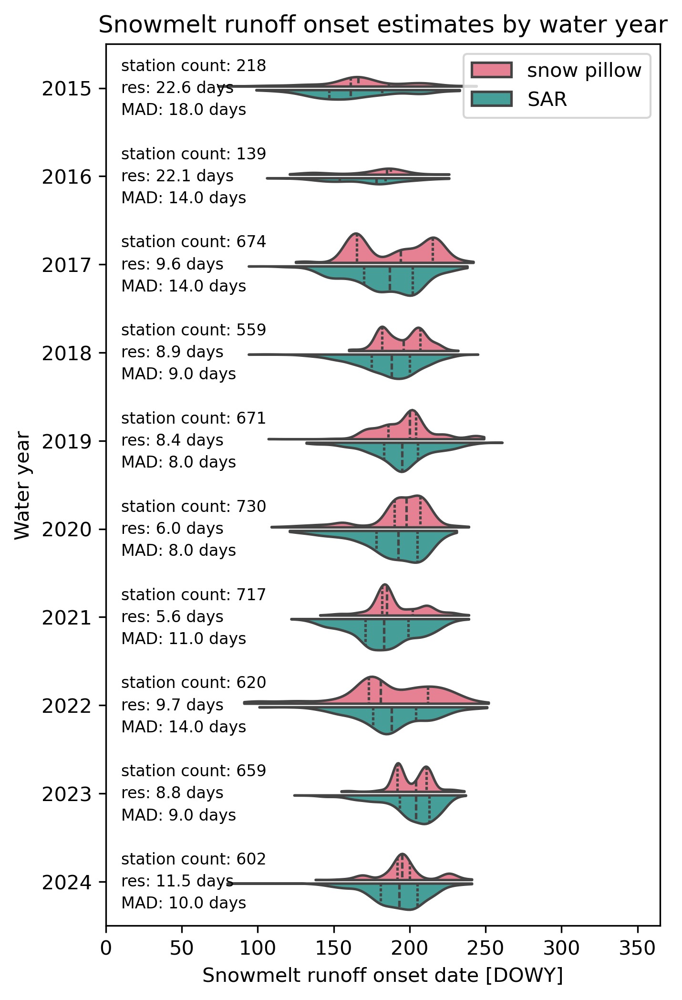

In [11]:
difference_variable = 'sar_minus_95pct'
station_variable = difference_variable.replace('sar_minus_','station_max_SWE_')+'_timing'
fcf_thresh = 50
buffer_radius = 1000 #fcf=30, buffer_radius=300
frac_valid = 0.01

#ds_subset = runoff_onset_max_swe_timing_WUS_ds.sel(fcf=30, buffer_radius=100).where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf'].sel(fcf=30, buffer_radius=100)>0.90)
ds_subset = runoff_onset_max_swe_timing_WUS_ds.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>=frac_valid).sel(fcf=fcf_thresh, buffer_radius=buffer_radius)
#ds_subset = runoff_onset_max_swe_timing_WUS_ds.sel(fcf=50, buffer_radius=500) #.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.5) #.where(runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_value']>0.2)

#ds_subset = ds_subset.where(ds_subset['sar_minus_stations'])
df_subset = ds_subset.to_dataframe().reset_index().dropna(subset=[difference_variable])

# Convert to pandas dataframe and reshape for plotting - keeping only necessary columns
df_swe = (df_subset[['WY', station_variable]]
          .rename(columns={station_variable:'Value'}))

df_runoff = (df_subset[['WY', 'runoff_onset_timing']]
             .rename(columns={'runoff_onset_timing':'Value'}))

df_difference = (df_subset[['WY', difference_variable]]
             .rename(columns={difference_variable:'Value'}))

# Add identifier column for violin split
df_swe['Derived from'] = 'snow pillow'
df_runoff['Derived from'] = 'SAR'

# Combine dataframes and keep only necessary columns
df_combined = pd.concat([df_swe, df_runoff],ignore_index=True)[['WY', 'Value', 'Derived from']]

# df_swe[df_swe['WY']==2016]
# df_runoff[df_runoff['WY']==2016]


#f,ax=plt.subplots(1,1,figsize=(9,5),dpi=300)#,height_ratios=[3,1]
f,ax=plt.subplots(1,1,figsize=(5,8),dpi=300)#,height_ratios=[3,1]

sns.violinplot(data=df_combined,
               x='Value',
               y='WY',
               hue='Derived from',
               inner='quartile',
               split=True,
               density_norm="count",
               palette="husl",
               gap=0.1,
               cut=0,
               ax=ax,
               orient='h',
               
               )


# sns.boxplot(ax=ax,
#             data=df_combined,
#             x='Value',
#             y='WY',
#             hue='Derived from',
#             palette="husl",
#             #whis=1.5, #(0,100)
#             #whis=(2,98),
#             fliersize=2,
#             width=0.7,
#             gap=0.1,
#             orient='h'
#             )  # whis parameter controls the whisker length


water_years = runoff_onset_max_swe_timing_WUS_ds.WY.values
y_positions = {}

# Get the actual y-coordinates for each water year category
for i, year in enumerate(sorted(df_combined['WY'].unique())):
    # The y-position is the tick position
    y_positions[year] = i



ax.set_title('Snowmelt runoff onset estimates by water year')
ax.set_xlabel('Snowmelt runoff onset date [DOWY]')
ax.set_ylabel('Water year')
ax.set_xlim([0,365])

ax.legend(loc='upper right')


temporal_resolution = [21.66,
21.15,
8.96,
8.70,
8.12,
5.69,
5.33,
9.65,
8.61,
11.12]

# Weighted average temporal resolution for 2015: 22.10
# Weighted average temporal resolution for 2016: 21.49
# Weighted average temporal resolution for 2017: 8.87
# Weighted average temporal resolution for 2018: 8.73
# Weighted average temporal resolution for 2019: 8.09
# Weighted average temporal resolution for 2020: 5.75
# Weighted average temporal resolution for 2021: 5.32
# Weighted average temporal resolution for 2022: 9.65
# Weighted average temporal resolution for 2023: 8.58
# Weighted average temporal resolution for 2024: 11.03

# Overall weighted average temporal resolution: 8.83

temporal_resolution = [round(mean,1) for year, mean in yearly_means.items()]

mads = []
counts = []

for i,WY in enumerate(runoff_onset_max_swe_timing_WUS_ds.WY.values):
    sar_minus_stations_da = runoff_onset_max_swe_timing_WUS_ds[difference_variable].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>=frac_valid).sel(fcf=fcf_thresh,buffer_radius=buffer_radius)#.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.8)#.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.5).where(runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_value']>0.2)
    count = sar_minus_stations_da.sel(WY=WY).count().values
    mad = np.abs(sar_minus_stations_da.sel(WY=WY)).median().values
    print(f'For {WY} with fcf_thresh of {fcf_thresh} and buffer_radius of {buffer_radius}, MAD = {mad}, count = {count}')
    counts.append(count)
    mads.append(mad)

    # ax.text(i, 30, f'MAD = {mad} days', horizontalalignment='center',size=6)
    # ax.text(i, 20, f'res = {temporal_resolution[i]} days', horizontalalignment='center',size=6)
    # ax.text(i, 10, f'# stations = {int(count)}', horizontalalignment='center',size=6)
    # Fix text positions - use WY as y-coordinate and fixed x-positions
    # ax.text(280, WY, f'MAD = {mad:.1f} days', horizontalalignment='left', size=8)
    # ax.text(280, WY-0.25, f'res = {temporal_resolution[i]:.1f} days', horizontalalignment='left', size=8)
    # ax.text(280, WY-0.5, f'n = {int(count)}', horizontalalignment='left', size=8)
    y_pos = y_positions[WY]
    
    # Add text with the correct y-position
    ax.text(10, y_pos - 0.25, f'station count: {int(count)}', ha='left',va='center', size=8)
    ax.text(10, y_pos , f'res: {temporal_resolution[i]:.1f} days', ha='left',va='center', size=8)
    ax.text(10, y_pos+0.25, f'MAD: {mad:.1f} days', ha='left', va='center',size=8)


# axs[1].bar(runoff_onset_max_swe_timing_WUS_ds.WY.values, mads)
# axs[1].set_title('Median absolute difference between runoff onset timing estimation methods')
# axs[1].set_ylabel('Days')
#axs[2].bar(runoff_onset_max_swe_timing_WUS_ds.WY.values, counts)


print(f'total MAD: {np.abs(sar_minus_stations_da).median().values}')
print(f'total mean: {sar_minus_stations_da.mean().values}')
print(f'total median: {sar_minus_stations_da.median().values}')
print(f'total stdev: {sar_minus_stations_da.std().values}')

# After your plotting code but before tight_layout
# Create a table to the right of the plot
# cell_text = []
# for i, WY in enumerate(runoff_onset_max_swe_timing_WUS_ds.WY.values):
#     cell_text.append([f'{mads[i]:.1f}', f'{temporal_resolution[i]:.1f}', f'{int(counts[i])}'])

# table = ax.table(cellText=cell_text,
#                  rowLabels=runoff_onset_max_swe_timing_WUS_ds.WY.values,
#                  colLabels=['MAD (days)', 'Resolution (days)', 'n'],
#                  loc='right',
#                  cellLoc='center')
# table.auto_set_font_size(False)
# table.set_fontsize(7)
# table.scale(1, 0.9)


#f.tight_layout()

#f.savefig(f'station_comparison.png')

In [12]:
df_subset

,station,WY,station_max_SWE_timing,station_max_SWE_value,station_max_SWE_99pct_timing,station_max_SWE_95pct_timing,station_max_SWE_90pct_timing,station_max_SWE_50pct_timing,runoff_onset_timing,frac_valid_fcf,...,longitude,state,HUC,mgrs,mountainRange,beginDate,endDate,csvData,buffer_radius,fcf
2,1135_UT_SNTL,2017,160.0,0.2032,160.0,160.0,162.0,171.0,145.0,0.627422,...,-110.850754,Utah,160101010105,12TWL,,2009-10-01,2025-06-22,True,1000,50
3,1135_UT_SNTL,2018,180.0,0.1448,180.0,181.0,182.0,188.0,164.0,0.627422,...,-110.850754,Utah,160101010105,12TWL,,2009-10-01,2025-06-22,True,1000,50
4,1135_UT_SNTL,2019,176.0,0.1981,176.0,184.0,186.0,202.0,195.0,0.627422,...,-110.850754,Utah,160101010105,12TWL,,2009-10-01,2025-06-22,True,1000,50
5,1135_UT_SNTL,2020,188.0,0.1626,188.0,189.0,190.0,193.0,178.0,0.627422,...,-110.850754,Utah,160101010105,12TWL,,2009-10-01,2025-06-22,True,1000,50
6,1135_UT_SNTL,2021,183.0,0.1702,183.0,185.0,185.0,191.0,144.0,0.627422,...,-110.850754,Utah,160101010105,12TWL,,2009-10-01,2025-06-22,True,1000,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9682,915_ID_SNTL,2017,213.0,0.4293,213.0,215.0,216.0,233.0,189.0,0.013870,...,-113.837318,Idaho,170602040604,12TTQ,Idaho-Bitterroot Rocky Mountains,1995-09-26,2025-06-22,True,1000,50
9685,915_ID_SNTL,2020,202.0,0.3073,203.0,204.0,208.0,218.0,219.0,0.013870,...,-113.837318,Idaho,170602040604,12TTQ,Idaho-Bitterroot Rocky Mountains,1995-09-26,2025-06-22,True,1000,50
9686,915_ID_SNTL,2021,185.0,0.2362,185.0,186.0,190.0,212.0,183.0,0.013870,...,-113.837318,Idaho,170602040604,12TTQ,Idaho-Bitterroot Rocky Mountains,1995-09-26,2025-06-22,True,1000,50
9687,915_ID_SNTL,2022,227.0,0.3124,227.0,228.0,229.0,246.0,237.0,0.013870,...,-113.837318,Idaho,170602040604,12TTQ,Idaho-Bitterroot Rocky Mountains,1995-09-26,2025-06-22,True,1000,50


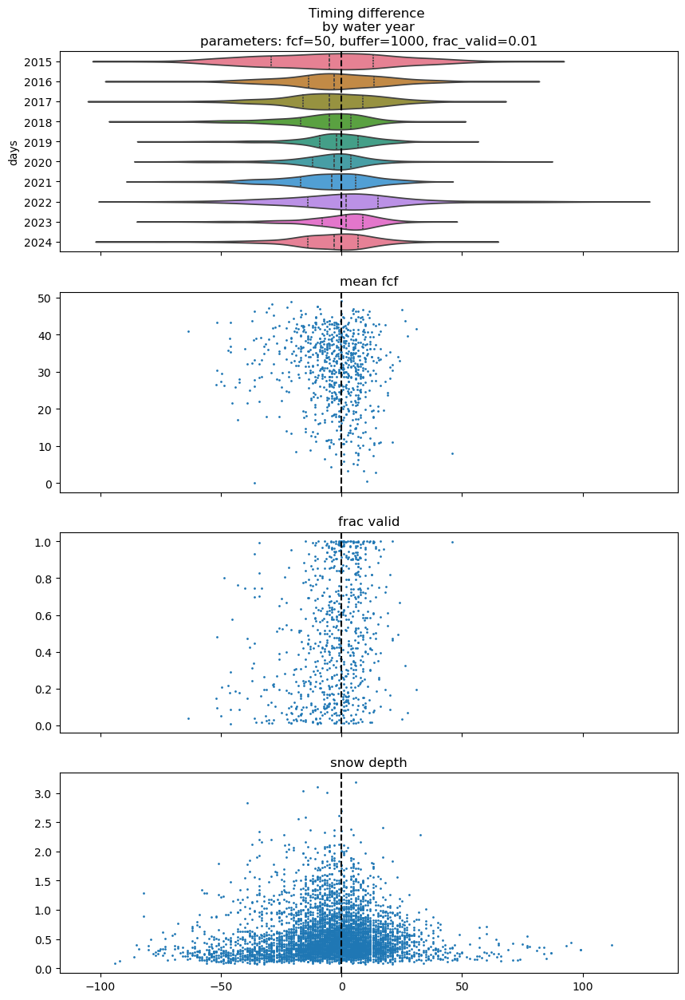

In [13]:
f,axs=plt.subplots(4,1,figsize=(10,15),sharex=True)

runoff_onset_max_swe_timing_WUS_subset_ds = runoff_onset_max_swe_timing_WUS_ds.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>=frac_valid).sel(fcf=fcf_thresh,buffer_radius=buffer_radius)

# for water_year in config.water_years:
#     axs[0].scatter(runoff_onset_max_swe_timing_WUS_subset_ds['sar_minus_stations'].sel(WY=water_year),runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],s=1)
#     axs[1].scatter(runoff_onset_max_swe_timing_WUS_subset_ds['sar_minus_stations'].sel(WY=water_year),runoff_onset_max_swe_timing_WUS_subset_ds['frac_valid_fcf'],s=1)


sns.violinplot(ax=axs[0],
               data=df_difference,
               x='Value',
               y='WY',
               hue='WY',
               inner='quartile',
               orient='h',
               #split=True,
               density_norm="width",
               palette="husl",
               #gap=0.1,
               legend=False,
               )
axs[0].set_title(f'Timing difference \nby water year\nparameters: fcf={fcf_thresh}, buffer={buffer_radius}, frac_valid={frac_valid}')
axs[0].set_ylabel('days')
axs[0].axvline(0, color='black', linestyle='--')


axs[1].scatter(runoff_onset_max_swe_timing_WUS_subset_ds[difference_variable].median(dim='WY'),runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],s=1)
axs[2].scatter(runoff_onset_max_swe_timing_WUS_subset_ds[difference_variable].median(dim='WY'),runoff_onset_max_swe_timing_WUS_subset_ds['frac_valid_fcf'],s=1)

axs[3].scatter(runoff_onset_max_swe_timing_WUS_subset_ds[difference_variable],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'],s=1)
axs[1].set_title('mean fcf')
axs[1].axvline(0,color='black',linestyle='--')

axs[2].set_title('frac valid')
axs[2].axvline(0,color='black',linestyle='--')

axs[3].set_title('snow depth')
axs[3].axvline(0,color='black',linestyle='--')


(0.0, 1.0)

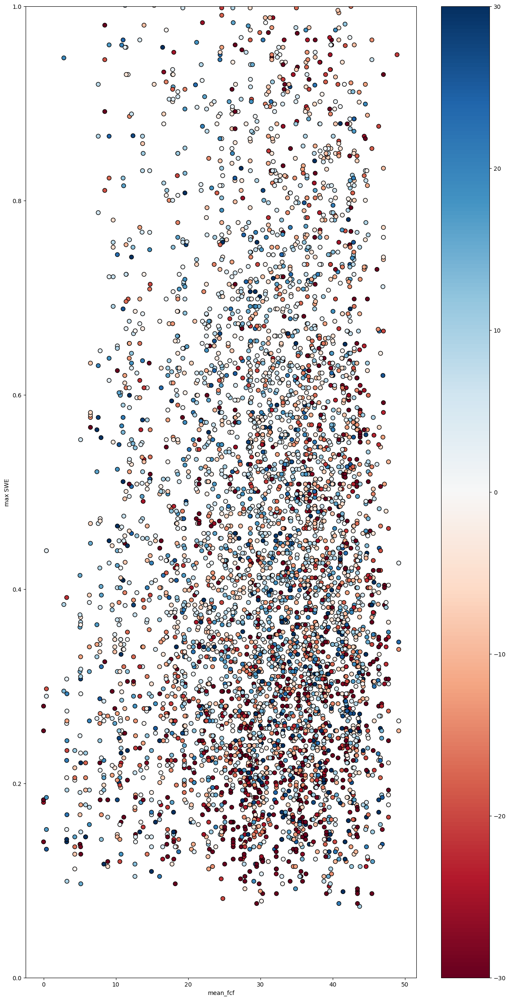

In [14]:
f,ax=plt.subplots(figsize=(15,30))

for water_year in config.water_years:
    plot = ax.scatter(runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'].sel(WY=water_year),c=runoff_onset_max_swe_timing_WUS_subset_ds[difference_variable].sel(WY=water_year),vmin=-30,vmax=30,cmap='RdBu',edgecolor='black',s=50)
f.colorbar(plot)

#ax.scatter(runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'].median(dim='WY'),c=runoff_onset_max_swe_timing_WUS_subset_ds['sar_minus_stations'].median(dim='WY'),vmin=-30,vmax=30,cmap='RdBu',edgecolor='black',s=50)

ax.set_xlabel('mean_fcf')
ax.set_ylabel('max SWE')

ax.set_ylim([0,1])

(0.0, 1.0)

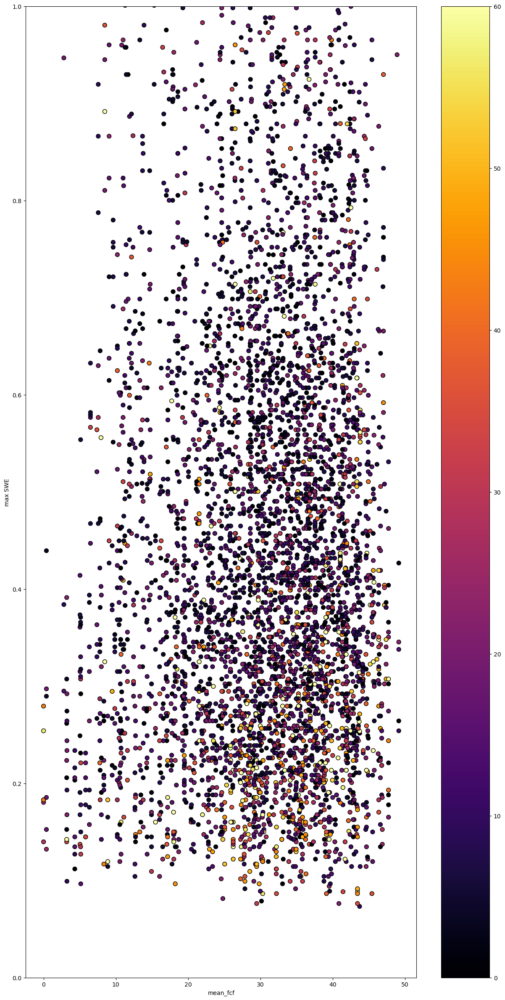

In [15]:
f,ax=plt.subplots(figsize=(15,30))

for water_year in config.water_years:
    plot = ax.scatter(runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'].sel(WY=water_year),c=np.abs(runoff_onset_max_swe_timing_WUS_subset_ds[difference_variable].sel(WY=water_year)),vmin=0,vmax=60,cmap='inferno',edgecolor='black',s=50)
f.colorbar(plot)

#ax.scatter(runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'].median(dim='WY'),c=runoff_onset_max_swe_timing_WUS_subset_ds['sar_minus_stations'].median(dim='WY'),vmin=-30,vmax=30,cmap='RdBu',edgecolor='black',s=50)

ax.set_xlabel('mean_fcf')
ax.set_ylabel('max SWE')

ax.set_ylim([0,1])

(0.0, 1.0)

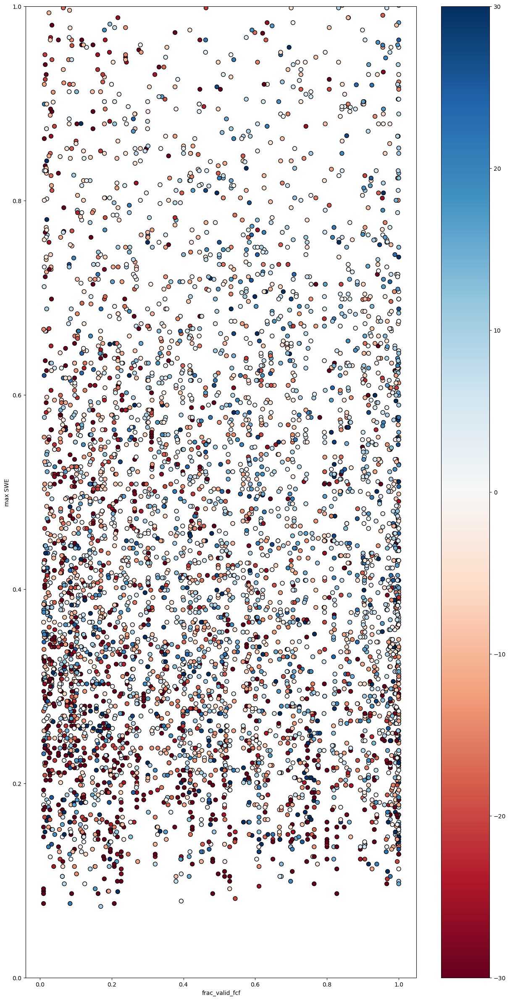

In [16]:
f,ax=plt.subplots(figsize=(15,30))

for water_year in config.water_years:
    plot = ax.scatter(runoff_onset_max_swe_timing_WUS_subset_ds['frac_valid_fcf'],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'].sel(WY=water_year),c=runoff_onset_max_swe_timing_WUS_subset_ds[difference_variable].sel(WY=water_year),vmin=-30,vmax=30,cmap='RdBu',edgecolor='black',s=50)
f.colorbar(plot)

#ax.scatter(runoff_onset_max_swe_timing_WUS_subset_ds['mean_fcf'],runoff_onset_max_swe_timing_WUS_subset_ds['station_max_SWE_value'].median(dim='WY'),c=runoff_onset_max_swe_timing_WUS_subset_ds['sar_minus_stations'].median(dim='WY'),vmin=-30,vmax=30,cmap='RdBu',edgecolor='black',s=50)

ax.set_xlabel('frac_valid_fcf')
ax.set_ylabel('max SWE')

ax.set_ylim([0,1])

In [17]:
runoff_onset_max_swe_timing_WUS_subset_ds

<xarray.Dataset> Size: 1MB
Dimensions:                       (station: 969, WY: 10)
Coordinates: (12/17)
    time                          (WY, station) datetime64[ns] 78kB 2015-03-1...
  * station                       (station) <U12 47kB '1135_UT_SNTL' ... '915...
    name                          (station) <U24 93kB 'Burts Miller Ranch' .....
    network                       (station) <U6 23kB 'SNOTEL' ... 'SNOTEL'
    elevation_m                   (station) float64 8kB 2.438e+03 ... 2.63e+03
    latitude                      (station) float64 8kB 40.98 44.79 ... 44.85
    ...                            ...
    beginDate                     (station) datetime64[ns] 8kB 2009-10-01 ......
    endDate                       (station) datetime64[ns] 8kB 2025-06-22 ......
    csvData                       (station) bool 969B True True ... True True
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
    buffer_radius                 int64 8B 1000
    fcf                           int64 8B 50
Data variables: (12/14)
    station_max_SWE_timing        (station, WY) float64 78kB 165.0 ... 193.0
    station_max_SWE_value         (station, WY) float64 78kB 0.1168 ... 0.2769
    station_max_SWE_99pct_timing  (station, WY) float64 78kB 165.0 ... 194.0
    station_max_SWE_95pct_timing  (station, WY) float64 78kB 165.0 ... 196.0
    station_max_SWE_90pct_timing  (station, WY) float64 78kB 166.0 ... 197.0
    station_max_SWE_50pct_timing  (station, WY) float64 78kB 170.0 ... 226.0
    ...                            ...
    mean_fcf                      (station) float64 8kB 29.16 nan ... 37.84
    sar_minus_stations            (station, WY) float64 78kB nan nan ... 14.0
    sar_minus_99pct               (station, WY) float64 78kB nan nan ... 13.0
    sar_minus_95pct               (station, WY) float64 78kB nan nan ... 11.0
    sar_minus_90pct               (station, WY) float64 78kB nan nan ... 10.0
    sar_minus_50pct               (station, WY) float64 78kB nan nan ... -19.0

In [18]:
# f,ax=plt.subplots(figsize=(10,10))
# station_max_swe_timing = runoff_onset_max_swe_timing_WUS_subset_ds.sel(WY=2023)['station_max_SWE_timing']
# elevation = runoff_onset_max_swe_timing_WUS_subset_ds.sel(WY=2023)['elevation_m']
# ax.scatter(elevation,runoff_onset_max_swe_timing,s=1)
# # ax.plot([0,365],[0,365],color='black',linestyle='--')

# # ax.set_xlabel('SNOTEL max SWE timing')
# # ax.set_ylabel('SAR runoff onset timing')
# # ax.set_xlim([125,250])
# # ax.set_ylim([125,250])

In [19]:
#sar_minus_stations_df = np.abs(runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.05).sel(fcf=70,buffer_radius=500)).median(dim='WY').to_dataframe()
sar_minus_stations_df = runoff_onset_max_swe_timing_WUS_subset_ds.median(dim='WY').to_dataframe()


sar_minus_stations_gdf = gpd.GeoDataFrame(sar_minus_stations_df, geometry=gpd.points_from_xy(sar_minus_stations_df.longitude, sar_minus_stations_df.latitude),crs='epsg:4326')
sar_minus_stations_gdf

,station_max_SWE_timing,station_max_SWE_value,station_max_SWE_99pct_timing,station_max_SWE_95pct_timing,station_max_SWE_90pct_timing,station_max_SWE_50pct_timing,runoff_onset_timing,frac_valid_fcf,mean_fcf,sar_minus_stations,...,state,HUC,mgrs,mountainRange,beginDate,endDate,csvData,buffer_radius,fcf,geometry
station,,,,,,,,,,,,,,,,,,,,,
1135_UT_SNTL,181.5,0.17275,181.5,184.5,185.5,190.5,174.5,0.627422,29.162420,-8.0,...,Utah,160101010105,12TWL,,2009-10-01,2025-06-22,True,1000,50,POINT (-110.85075 40.98492)
448_MT_SNTL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Montana,100200030102,12TVQ,Central Montana Rocky Mountains,1971-01-01,2025-06-22,True,1000,50,POINT (-112.05645 44.79317)
TMR,168.0,0.61870,169.0,171.0,180.0,196.0,179.5,0.216906,41.439899,10.0,...,California,180400060903,11SLB,Sierra Nevada,2011-01-01,2025-06-22,True,1000,50,POINT (-119.20053 37.16375)
872_WY_SNTL,192.0,0.25650,193.0,198.0,204.0,213.0,173.0,0.389213,35.664509,-16.0,...,Wyoming,101800080802,13TDG,Southern Rocky Mountains,1979-10-01,2025-06-22,True,1000,50,POINT (-105.57816 42.2802)
773_CO_SNTL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Colorado,110200011206,13SDC,Southern Rocky Mountains,1990-10-01,2025-06-22,True,1000,50,POINT (-105.53787 37.96811)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644_WA_SNTL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Washington,170200061903,11ULP,Columbia Mountains,1991-10-01,2025-06-19,True,1000,50,POINT (-119.08159 48.36163)
327_CO_SNTL,193.0,0.56895,193.5,196.0,198.5,223.5,220.0,1.000000,11.005841,24.0,...,Colorado,130100010104,13SBB,Southern Rocky Mountains,1979-10-01,2025-06-22,True,1000,50,POINT (-107.51212 37.71409)
417_NV_SNTL,187.5,0.48135,188.0,192.5,198.0,221.5,179.0,0.898944,16.982759,-4.0,...,Nevada,160401030401,11TPE,Great Basin Ranges,1978-10-01,2025-06-22,True,1000,50,POINT (-115.54017 40.27551)


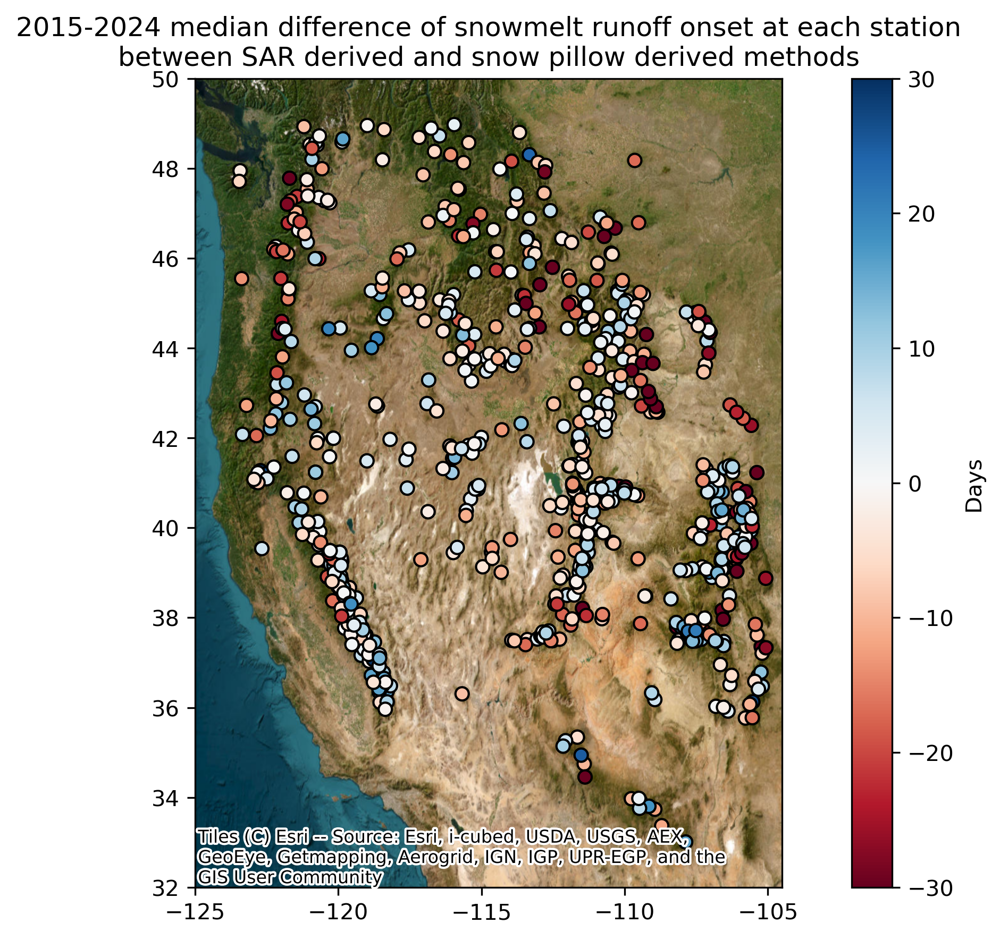

In [20]:
f,ax=plt.subplots(figsize=(9,6),dpi=300)
#sar_minus_stations_gdf.plot(ax=ax, column='sar_minus_stations', cmap='Reds', vmax=30, legend=True)
sar_minus_stations_gdf.plot(ax=ax, column=difference_variable, cmap='RdBu', edgecolor='black',vmin=-30, vmax=30, legend=True, legend_kwds={"label":"Days"}) # legend_kwargs={"label":"Days"}# positive/blue is SAR after station max SWE
ax.set_xlim([-125,-104.5])
ax.set_ylim([32,50])

ax.set_title(f'2015-2024 median difference of snowmelt runoff onset at each station\nbetween SAR derived and snow pillow derived methods')
ctx.add_basemap(ax, crs=sar_minus_stations_gdf.crs.to_string(), source=ctx.providers.Esri.WorldImagery)
f.tight_layout()

#f.savefig(f'station_comparison_map.png')

In [21]:
#sar_minus_stations_gdf.explore(column=difference_variable,cmap='RdBu',vmin=-30,vmax=30)

For 2015 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 18.0, count = 218
For 2016 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 14.0, count = 139
For 2017 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 14.0, count = 674
For 2018 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 9.0, count = 559
For 2019 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 8.0, count = 671
For 2020 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 8.0, count = 730
For 2021 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 11.0, count = 717
For 2022 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 14.0, count = 620
For 2023 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 9.0, count = 659
For 2024 with fcf_thresh of 50 and buffer_radius of 1000, MAD = 10.0, count = 602


Text(0.5, 1.0, '')

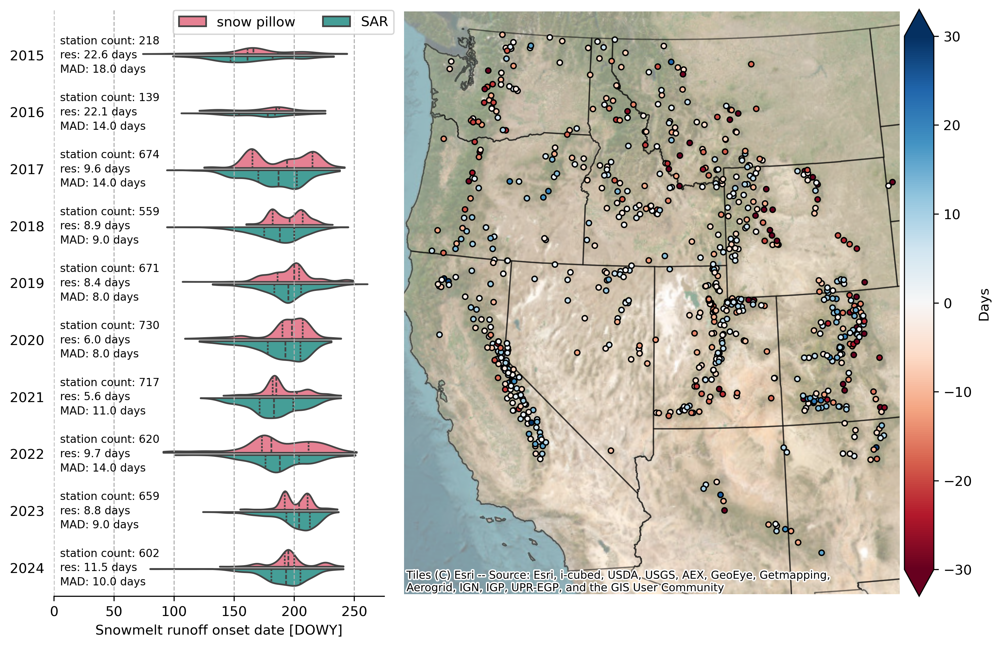

In [28]:

# 15,8
f,axs=plt.subplots(1,2,figsize=(10.1,6.5),dpi=300, layout='constrained', width_ratios=[2,3])#,height_ratios=[3,1]

axs[0].grid(which='major', axis='x', linestyle='--',zorder=0)

sns.violinplot(data=df_combined,
               x='Value',
               y='WY',
               hue='Derived from',
               inner='quartile',
               split=True,
               density_norm="count",
               palette="husl",
               gap=0.1,
               cut=0,
               ax=axs[0],
               orient='h',
               
               )


# sns.boxplot(ax=axs[0],
#             data=df_combined,
#             x='Value',
#             y='WY',
#             hue='Derived from',
#             palette="husl",
#             #whis=1.5, #(0,100)
#             #whis=(2,98),
#             fliersize=2,
#             width=0.7,
#             gap=0.1,
#             orient='h'
#             )  # whis parameter controls the whisker length


water_years = runoff_onset_max_swe_timing_WUS_ds.WY.values
y_positions = {}

# Get the actual y-coordinates for each water year category
for i, year in enumerate(sorted(df_combined['WY'].unique())):
    # The y-position is the tick position
    y_positions[year] = i



axs[0].set_title('Snowmelt runoff onset estimates\nby water year')
axs[0].set_xlabel('Snowmelt runoff onset date [DOWY]')
axs[0].set_ylabel('') # Water year
# axs[0].set_xlim([0,365])
axs[0].set_xlim([0,275])
axs[0].set_ylim([9.5,-0.8])

axs[0].legend(loc='upper right',ncols=2,bbox_to_anchor=(1.05, 1.01)) # title='runoff onset estimation method'

# remove border of axs[0]
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].spines['left'].set_visible(False)
# remove ticks of axs[0]
#axs[0].tick_params(axis='x', which='both', bottom=False, top=False)
axs[0].tick_params(axis='y', which='both', left=False, right=False)


temporal_resolution = [round(mean,1) for year, mean in yearly_means.items()]

mads = []
counts = []

for i,WY in enumerate(runoff_onset_max_swe_timing_WUS_ds.WY.values):
    sar_minus_stations_da = runoff_onset_max_swe_timing_WUS_ds[difference_variable].where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>=frac_valid).sel(fcf=fcf_thresh,buffer_radius=buffer_radius)#.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.8)#.where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.5).where(runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_value']>0.2)
    count = sar_minus_stations_da.sel(WY=WY).count().values
    mad = np.abs(sar_minus_stations_da.sel(WY=WY)).median().values
    print(f'For {WY} with fcf_thresh of {fcf_thresh} and buffer_radius of {buffer_radius}, MAD = {mad}, count = {count}')
    counts.append(count)
    mads.append(mad)

    y_pos = y_positions[WY]
    
    # Add text with the correct y-position
    axs[0].text(5, y_pos - 0.25, f'station count: {int(count)}', ha='left',va='center', size=8)
    axs[0].text(5, y_pos , f'res: {temporal_resolution[i]:.1f} days', ha='left',va='center', size=8)
    axs[0].text(5, y_pos+0.25, f'MAD: {mad:.1f} days', ha='left', va='center',size=8)

aea_proj_str = "+proj=aea +lon_0=-113.5546875 +lat_1=34.961985 +lat_2=46.796971 +lat_0=40.879478 +datum=WGS84 +units=m +no_defs"

states_gdf = gpd.read_file('http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json').to_crs(aea_proj_str)
states_gdf.boundary.plot(ax=axs[1], edgecolor='black', linewidth=1, zorder=1, alpha=0.5)

#sar_minus_stations_gdf.plot(ax=ax, column='sar_minus_stations', cmap='Reds', vmax=30, legend=True)
sar_minus_stations_gdf.to_crs(aea_proj_str).plot(ax=axs[1], column=difference_variable, cmap='RdBu', edgecolor='black',vmin=-30, vmax=30, legend=True, legend_kwds={"label":"Days", "pad": 0.01, "extend": "both"},zorder=2,s=15) # legend_kwargs={"label":"Days"}# positive/blue is SAR after station max SWE , "shrink":0.99
# axs[1].set_xlim([-125,-104.5])
# axs[1].set_ylim([32,50])

axs[1].set_xlim([-0.9E6,0.8E6])
axs[1].set_ylim([-1.0E6,1.0E6])

axs[1].set_aspect('equal')
axs[1].axis('off')
# transform previous lat lon bounds to aea



axs[1].set_title(f'2015-2024 median difference\nbetween snowmelt runoff onset methods')
ctx.add_basemap(axs[1], crs=states_gdf.crs.to_string(), source=ctx.providers.Esri.WorldImagery,alpha=0.5)
#f.tight_layout()

axs[0].set_title('')
axs[1].set_title('')

#f.savefig(f'station_comparison_map.png')

In [ ]:
#sar_minus_stations_gdf.explore(difference_variable, tiles=xyz.providers.Esri.WorldImagery,edgecolor='black',vmin=-30,vmax=30,cmap='RdBu',marker_kwds={'radius':4},style_kwds={'fillOpacity':100}) #

/tmp/ipykernel_3901973/4021263115.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


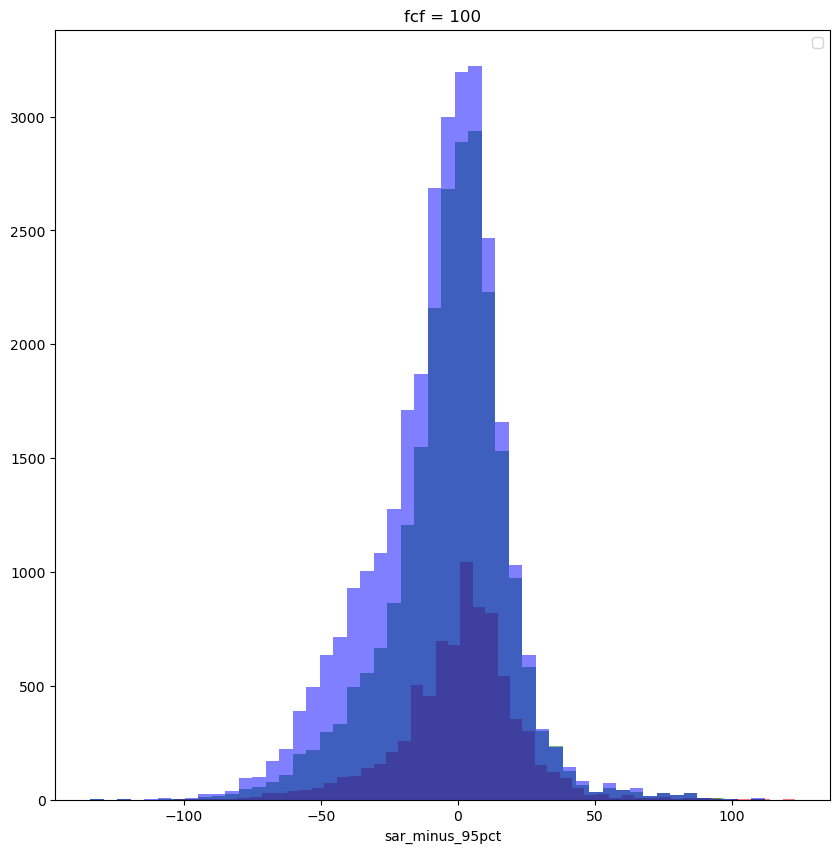

In [33]:
f,ax=plt.subplots(figsize=(10,10))
#runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_timing'].plot.hist(ax=ax,alpha=0.5,bins=50,color='black')
runoff_onset_max_swe_timing_WUS_ds[difference_variable].sel(fcf=10).plot.hist(ax=ax,alpha=0.5,bins=50,color='red')
runoff_onset_max_swe_timing_WUS_ds[difference_variable].sel(fcf=50).plot.hist(ax=ax,alpha=0.5,bins=50,color='green')
runoff_onset_max_swe_timing_WUS_ds[difference_variable].sel(fcf=100).plot.hist(ax=ax,alpha=0.5,bins=50,color='blue')
# .where(runoff_onset_max_swe_timing_WUS_ds['frac_valid_fcf']>0.80).sel(fcf=100)
ax.legend()

<Axes: xlabel='mean_fcf', ylabel='station_max_SWE_value'>

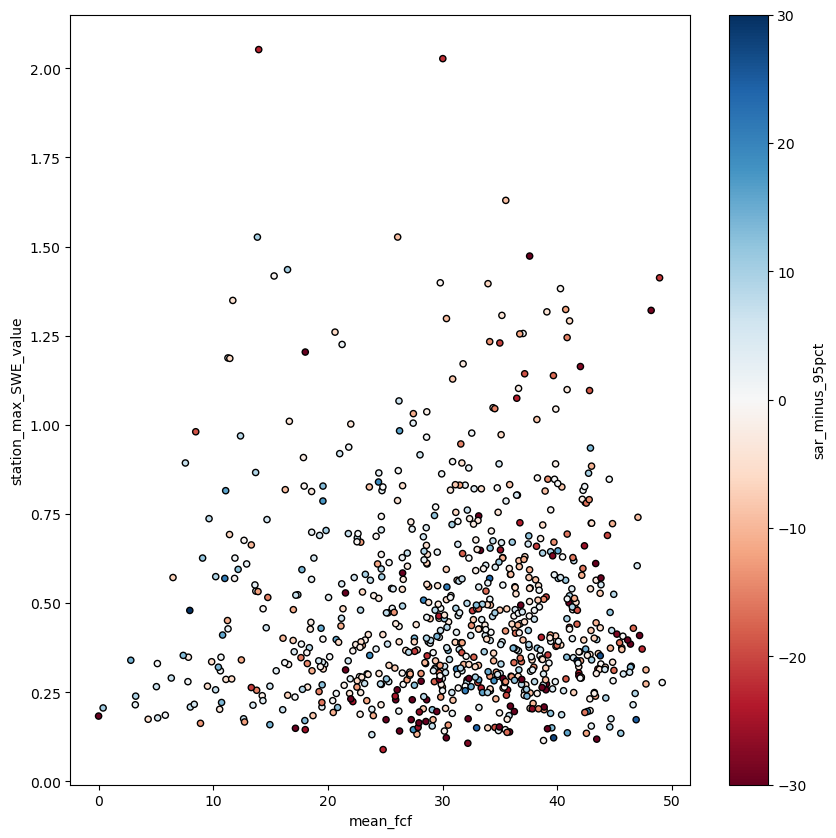

In [34]:
f,ax=plt.subplots(figsize=(10,10))

sar_minus_stations_gdf.plot.scatter(ax=ax,y='station_max_SWE_value',x='mean_fcf',c=difference_variable,cmap='RdBu',vmin=-30,vmax=30,edgecolor='black',s=20)

#ax.axvline(0,color='black',linestyle='--')

## Code graveyard

In [ ]:
#fcf_thresh_values = [10,20,30,40,50,60,70,80,90,100]
# buffer_radii = [50,100,300,500,1000]

# def process_single_station(station_code):
#     fcf_thresh_values = [10,20,30,40,50,60,70,80,90,100]
#     buffer_radii = [50,100,300,500,1000]
#     """Process all buffer/fcf combinations for a single station"""
#     station_results = {
#         'runoff_onset': {},
#         'frac_valid': {},
#         'mean_fcf': {}
#     }
    
#     runoff_onset_global_ds = xr.open_zarr(config.global_runoff_store, consolidated=True,decode_coords='all')
    
#     try:
#         for buffer_radius in buffer_radii:
#             station_gdf = get_station_gdf(station_code, buffer_radius)
#             runoff_onset_station_ds = get_station_buffered_runoff_onset(
#                 runoff_onset_global_ds, 
#                 station_gdf
#             )
            
#             for fcf_thresh in fcf_thresh_values:
#                 key = (station_code, buffer_radius, fcf_thresh)
                
#                 # Calculate metrics for this combination
#                 runoff_onset = runoff_onset_station_ds['runoff_onset'].where(
#                     runoff_onset_station_ds['fcf'] <= fcf_thresh
#                 ).median(dim=['x', 'y']).rename({'water_year':'WY'})
                
#                 frac_valid = (runoff_onset_station_ds['fcf'].where(
#                     runoff_onset_station_ds['fcf'] <= fcf_thresh
#                 ).count(dim=['x', 'y'])/runoff_onset_station_ds['fcf'].count(dim=['x', 'y']))
                
#                 mean_fcf = runoff_onset_station_ds['fcf'].where(
#                     runoff_onset_station_ds['fcf'] <= fcf_thresh
#                 ).mean(dim=['x', 'y'])
                
#                 station_results['runoff_onset'][key] = runoff_onset
#                 station_results['frac_valid'][key] = frac_valid
#                 station_results['mean_fcf'][key] = mean_fcf
                
#     except Exception as e:
#         print(f"Error processing station {station_code}: {e}")
        
#     return station_results


# station_codes = list(runoff_onset_max_swe_timing_WUS_ds.station.values)

# # futures = []
# # for station_code in runoff_onset_max_swe_timing_WUS_ds.station.values:
# #     future = client.submit(
# #         process_single_station,
# #         station_code,
# #     )
# #     futures.append(future)

# futures = [client.submit(process_single_station, station_code) for station_code in station_codes]

# # Gather results
# print(f"Computing {len(futures)} station tasks in parallel...")
# results = client.gather(futures)
# results


# # Create output arrays with same structure as before
# runoff_onset_timing = xr.DataArray(
#     data=np.nan,
#     dims=["station", "WY", "buffer_radius", "fcf"],
#     coords={
#         "station": runoff_onset_max_swe_timing_WUS_ds.station,
#         "WY": runoff_onset_max_swe_timing_WUS_ds.WY,
#         "buffer_radius": buffer_radii,
#         "fcf": fcf_thresh_values
#     }
# )

# frac_valid_fcf = xr.DataArray(
#     data=np.nan,
#     dims=["station", "buffer_radius", "fcf"],
#     coords={
#         "station": runoff_onset_max_swe_timing_WUS_ds.station,
#         "buffer_radius": buffer_radii,
#         "fcf": fcf_thresh_values
#     }
# )

# mean_fcf = xr.DataArray(
#     data=np.nan,
#     dims=["station", "buffer_radius", "fcf"],
#     coords={
#         "station": runoff_onset_max_swe_timing_WUS_ds.station,
#         "buffer_radius": buffer_radii,
#         "fcf": fcf_thresh_values
#     }
# )


# # Populate arrays from results
# for station_result in results:
#     for key, onset in station_result['runoff_onset'].items():
#         station, buffer, fcf = key
#         runoff_onset_timing.loc[dict(station=station, buffer_radius=buffer, fcf=fcf)] = onset
#         frac_valid_fcf.loc[dict(station=station, buffer_radius=buffer, fcf=fcf)] = station_result['frac_valid'][key]
#         mean_fcf.loc[dict(station=station, buffer_radius=buffer, fcf=fcf)] = station_result['mean_fcf'][key]

# # Create final dataset and save
# runoff_onset_max_swe_timing_WUS_ds = runoff_onset_max_swe_timing_WUS_ds.assign(
#     runoff_onset_timing=runoff_onset_timing,
#     frac_valid_fcf=frac_valid_fcf,
#     mean_fcf=mean_fcf
# )

# runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'] = (
#     runoff_onset_max_swe_timing_WUS_ds['runoff_onset_timing'] - 
#     runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_timing']
# )

# runoff_onset_max_swe_timing_WUS_ds

# runoff_onset_max_swe_timing_WUS_ds.drop_vars('geometry').to_netcdf('snotel_sar_differences_vv_v4.nc')


# fcf_thresh_values = [10,20,30,40,50,60,70,80,90,100]
# buffer_radii = [100,200,300,500,1000]

# runoff_onset_timing_WUS_ds = xr.DataArray(
#     data=np.nan,  # Initialize with NaNs
#     dims=["station","WY","buffer_radius","fcf"],
#     coords={"station": runoff_onset_max_swe_timing_WUS_ds.station, "WY": runoff_onset_max_swe_timing_WUS_ds.WY, "buffer_radius": buffer_radii, "fcf": fcf_thresh_values},
#     name="runoff_onset_timing"
# )

# frac_valid_fcf_WUS_ds = xr.DataArray(
#     data=np.nan,  # Initialize with NaNs
#     dims=["station","buffer_radius","fcf"],
#     coords={"station": runoff_onset_max_swe_timing_WUS_ds.station, "buffer_radius": buffer_radii, "fcf": fcf_thresh_values},
#     name="pixel_count"
# )

# mean_fcf_WUS_ds = xr.DataArray(
#     data=np.nan,  # Initialize with NaNs
#     dims=["station","buffer_radius","fcf"],
#     coords={"station": runoff_onset_max_swe_timing_WUS_ds.station, "buffer_radius": buffer_radii, "fcf": fcf_thresh_values},
#     name="mean_fcf"
# )


# # Iterate over each station
# for station_code in tqdm.tqdm(runoff_onset_max_swe_timing_WUS_ds.station.values):
#     print(f'Processing station {station_code}')
#     for buffer_radius in buffer_radii:
#         print(f'Processing buffer radius {buffer_radius}')
#         try: 
#             station_gdf = get_station_gdf(station_code, buffer_radius)

#             runoff_onset_station_ds = get_station_buffered_runoff_onset(runoff_onset_global_ds, station_gdf)
#             runoff_onset_station_ds = runoff_onset_station_ds.where(runoff_onset_station_ds['worldcover']!=80)
            
#             # Assign the calculated timing to the new DataArray
#             for fcf_thresh in fcf_thresh_values:
#                 runoff_onset_timing_WUS_ds.loc[dict(station=station_code,buffer_radius=buffer_radius,fcf=fcf_thresh)] = runoff_onset_station_ds['runoff_onset'].where(runoff_onset_station_ds['fcf'] <= fcf_thresh).median(dim=['x', 'y']).rename({'water_year':'WY'})
#                 frac_valid_fcf_WUS_ds.loc[dict(station=station_code,buffer_radius=buffer_radius,fcf=fcf_thresh)] = (runoff_onset_station_ds['fcf'].where(runoff_onset_station_ds['fcf'] <= fcf_thresh).count(dim=['x', 'y'])/runoff_onset_station_ds['fcf'].count(dim=['x', 'y']))
#                 mean_fcf_WUS_ds.loc[dict(station=station_code,buffer_radius=buffer_radius,fcf=fcf_thresh)] = runoff_onset_station_ds['fcf'].where(runoff_onset_station_ds['fcf'] <= fcf_thresh).mean(dim=['x', 'y'])

#         except Exception as e:
#             print(e)

# runoff_onset_max_swe_timing_WUS_ds = runoff_onset_max_swe_timing_WUS_ds.assign(runoff_onset_timing=runoff_onset_timing_WUS_ds)
# runoff_onset_max_swe_timing_WUS_ds = runoff_onset_max_swe_timing_WUS_ds.assign(frac_valid_fcf=frac_valid_fcf_WUS_ds)
# runoff_onset_max_swe_timing_WUS_ds = runoff_onset_max_swe_timing_WUS_ds.assign(mean_fcf=mean_fcf_WUS_ds)
# runoff_onset_max_swe_timing_WUS_ds['sar_minus_stations'] = runoff_onset_max_swe_timing_WUS_ds['runoff_onset_timing'] - runoff_onset_max_swe_timing_WUS_ds['station_max_SWE_timing']
# runoff_onset_max_swe_timing_WUS_ds.drop_vars('geometry').to_netcdf(f'snotel_sar_differences_vv_v4.nc')